# Food-11 Image Classification
### Artificial Intelligence and Machine Learning
**Name:** Aashish Shrestha | **ID:** 2431874

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

archive_path = '/content/drive/MyDrive/archive.zip'
dest_path = '/content/food11'

if not os.path.exists(dest_path):
    os.makedirs(dest_path)
    with zipfile.ZipFile(archive_path, 'r') as zf:
        zf.extractall(dest_path)
    print("extraction complete")
else:
    print("already extracted")

for root, dirs, files in os.walk(dest_path):
    depth = root.replace(dest_path, '').count(os.sep)
    if depth < 2:
        pad = ' ' * 2 * depth
        print(f'{pad}{os.path.basename(root)}/ ({len(files)} files)')

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random
import zipfile
import os
import time

sns.set_style("darkgrid")
plt.rcParams['figure.dpi'] = 100
random.seed(42)

## 1. Exploratory Data Analysis
Understanding the structure, class distribution, and image properties of the Food-11 dataset before any modelling.

In [6]:
ROOT_PATH = '/content/drive/MyDrive/AI & Machine Learning/Assignment/Task1 (Image Classification)/foodDataSet'
TRAIN_FOLDER = os.path.join(ROOT_PATH, 'training')
VAL_FOLDER = os.path.join(ROOT_PATH, 'validation')
TEST_FOLDER = os.path.join(ROOT_PATH, 'evaluation')

for folder, label in [(TRAIN_FOLDER, 'Training'), (VAL_FOLDER, 'Validation'), (TEST_FOLDER, 'Evaluation')]:
    if os.path.exists(folder):
        cats = sorted([c for c in os.listdir(folder) if os.path.isdir(os.path.join(folder, c))])
        print(f"{label}: {len(cats)} classes -> {cats}")
    else:
        print(f"{label}: NOT FOUND")

Training: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Validation: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Evaluation: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']


In [7]:
def make_dataframe(folder, partition):
    records = []
    if not os.path.exists(folder):
        return pd.DataFrame(records)
    for category in sorted(os.listdir(folder)):
        cat_dir = os.path.join(folder, category)
        if not os.path.isdir(cat_dir):
            continue
        for fname in os.listdir(cat_dir):
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                records.append({
                    'filepath': os.path.join(cat_dir, fname),
                    'category': category,
                    'partition': partition,
                    'fname': fname
                })
    return pd.DataFrame(records)

train_frame = make_dataframe(TRAIN_FOLDER, 'Training')
val_frame = make_dataframe(VAL_FOLDER, 'Validation')
test_frame = make_dataframe(TEST_FOLDER, 'Evaluation')
full_frame = pd.concat([train_frame, val_frame, test_frame], ignore_index=True)

print(f"training:   {len(train_frame)}")
print(f"validation: {len(val_frame)}")
print(f"evaluation: {len(test_frame)}")
print(f"total:      {len(full_frame)}")

training:   9866
validation: 3430
evaluation: 3347
total:      16643


In [8]:
count_tbl = full_frame.groupby(['category', 'partition']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in count_tbl.columns:
        count_tbl[col] = 0
count_tbl['Total'] = count_tbl[['Training', 'Validation', 'Evaluation']].sum(axis=1)
count_tbl = count_tbl[['Training', 'Validation', 'Evaluation', 'Total']]
count_tbl = count_tbl.sort_values('Total', ascending=False)
print(count_tbl)
print(f"\nlargest class:  {count_tbl.index[0]} ({count_tbl['Total'].iloc[0]})")
print(f"smallest class: {count_tbl.index[-1]} ({count_tbl['Total'].iloc[-1]})")
print(f"imbalance ratio: {count_tbl['Total'].iloc[0] / count_tbl['Total'].iloc[-1]:.1f}x")

partition        Training  Validation  Evaluation  Total
category                                                
Dessert              1500         500         500   2500
Soup                 1500         500         500   2500
Meat                 1325         449         432   2206
Bread                 994         362         368   1724
Egg                   986         327         335   1648
Seafood               855         347         303   1505
Fried food            848         326         287   1461
Vegetable-Fruit       709         232         231   1172
Noodles-Pasta         440         147         147    734
Dairy product         429         144         148    721
Rice                  280          96          96    472

largest class:  Dessert (2500)
smallest class: Rice (472)
imbalance ratio: 5.3x


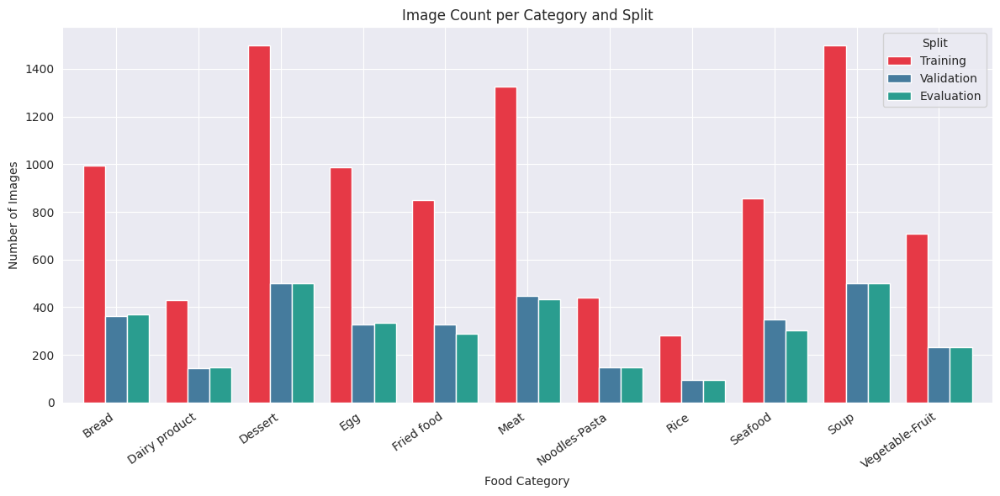

In [9]:
fig, ax = plt.subplots(figsize=(12, 6))
plot_tbl = full_frame.groupby(['category', 'partition']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in plot_tbl.columns:
        plot_tbl[col] = 0
plot_tbl = plot_tbl[['Training', 'Validation', 'Evaluation']]
plot_tbl.plot(kind='bar', ax=ax, color=['#E63946', '#457B9D', '#2A9D8F'], width=0.8)
ax.set_title('Image Count per Category and Split')
ax.set_xlabel('Food Category')
ax.set_ylabel('Number of Images')
ax.legend(title='Split')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

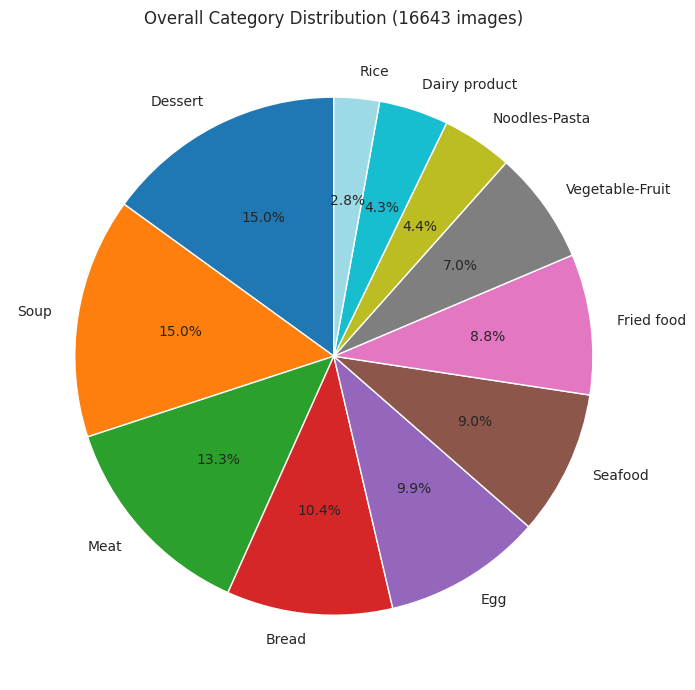

In [10]:
cat_totals = full_frame['category'].value_counts()
fig, ax = plt.subplots(figsize=(9, 7))
palette = plt.cm.tab20(np.linspace(0, 1, len(cat_totals)))
ax.pie(cat_totals.values, labels=cat_totals.index, autopct='%1.1f%%',
       colors=palette, startangle=90, textprops={'fontsize': 10})
ax.set_title(f'Overall Category Distribution ({len(full_frame)} images)')
plt.tight_layout()
plt.show()

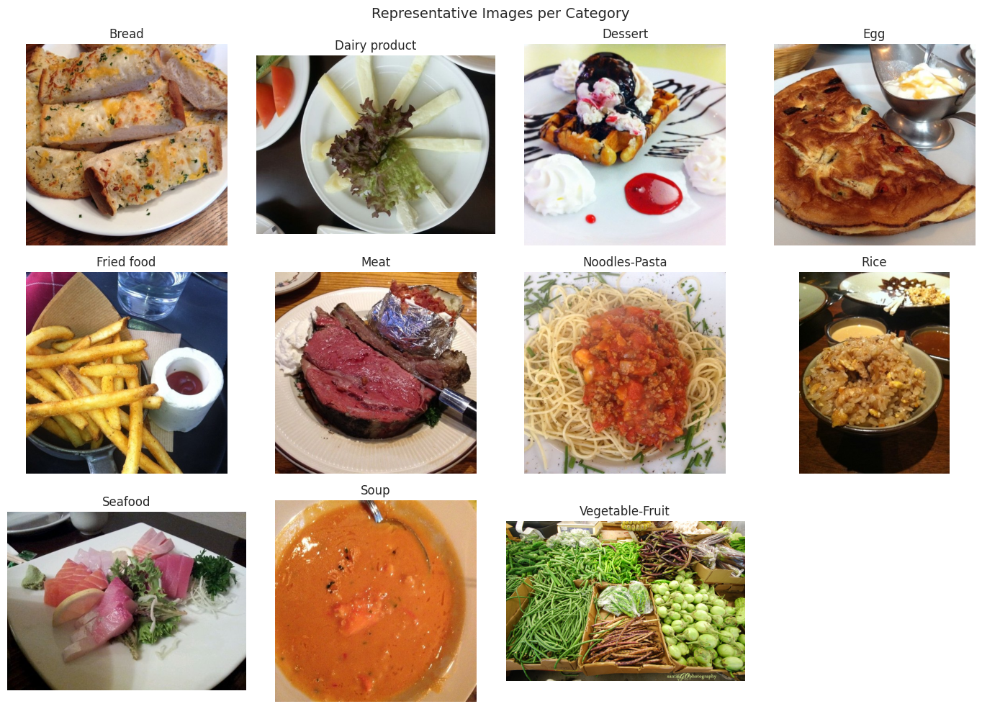

In [11]:
category_list = sorted(full_frame['category'].unique())
n_cats = len(category_list)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes = axes.flatten()
for idx, cat in enumerate(category_list):
    cat_imgs = train_frame[train_frame['category'] == cat]['filepath'].tolist()
    if cat_imgs:
        img = Image.open(random.choice(cat_imgs))
        axes[idx].imshow(img)
        axes[idx].set_title(cat)
        axes[idx].axis('off')
for idx in range(n_cats, len(axes)):
    axes[idx].axis('off')
plt.suptitle('Representative Images per Category', fontsize=14)
plt.tight_layout()
plt.show()

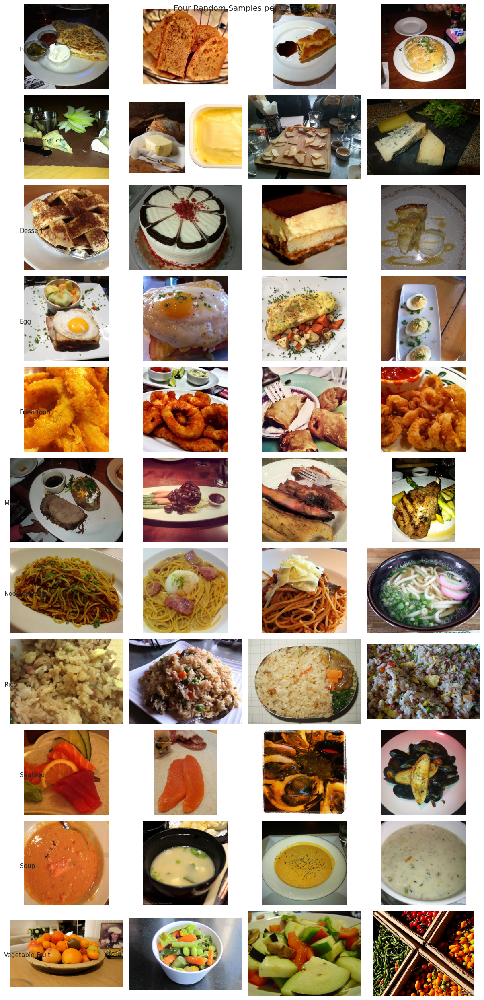

In [12]:
fig, axes = plt.subplots(n_cats, 4, figsize=(12, 2.3 * n_cats))
for i, cat in enumerate(category_list):
    cat_imgs = train_frame[train_frame['category'] == cat]['filepath'].tolist()
    picks = random.sample(cat_imgs, min(4, len(cat_imgs)))
    for j in range(4):
        if j < len(picks):
            img = Image.open(picks[j])
            axes[i, j].imshow(img)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_title(cat, fontsize=11, loc='left', x=-0.05, y=0.4)
plt.suptitle('Four Random Samples per Category', fontsize=14)
plt.tight_layout()
plt.show()

In [13]:
sampled_df = train_frame.sample(n=min(500, len(train_frame)), random_state=42)
img_widths, img_heights, img_ratios = [], [], []
for fp in sampled_df['filepath']:
    try:
        img = Image.open(fp)
        w, h = img.size
        img_widths.append(w)
        img_heights.append(h)
        img_ratios.append(w / h)
    except:
        continue

print(f"width  - min: {min(img_widths)}, max: {max(img_widths)}, avg: {np.mean(img_widths):.0f}")
print(f"height - min: {min(img_heights)}, max: {max(img_heights)}, avg: {np.mean(img_heights):.0f}")
print(f"aspect ratio - avg: {np.mean(img_ratios):.2f}")

width  - min: 287, max: 1200, avg: 508
height - min: 255, max: 1024, avg: 480
aspect ratio - avg: 1.08


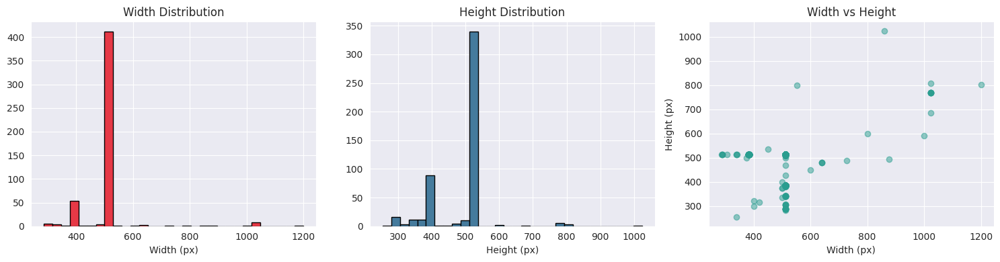

In [14]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(img_widths, bins=30, color='#E63946', edgecolor='black')
axes[0].set_title('Width Distribution')
axes[0].set_xlabel('Width (px)')
axes[1].hist(img_heights, bins=30, color='#457B9D', edgecolor='black')
axes[1].set_title('Height Distribution')
axes[1].set_xlabel('Height (px)')
axes[2].scatter(img_widths, img_heights, alpha=0.5, color='#2A9D8F')
axes[2].set_title('Width vs Height')
axes[2].set_xlabel('Width (px)')
axes[2].set_ylabel('Height (px)')
plt.tight_layout()
plt.show()

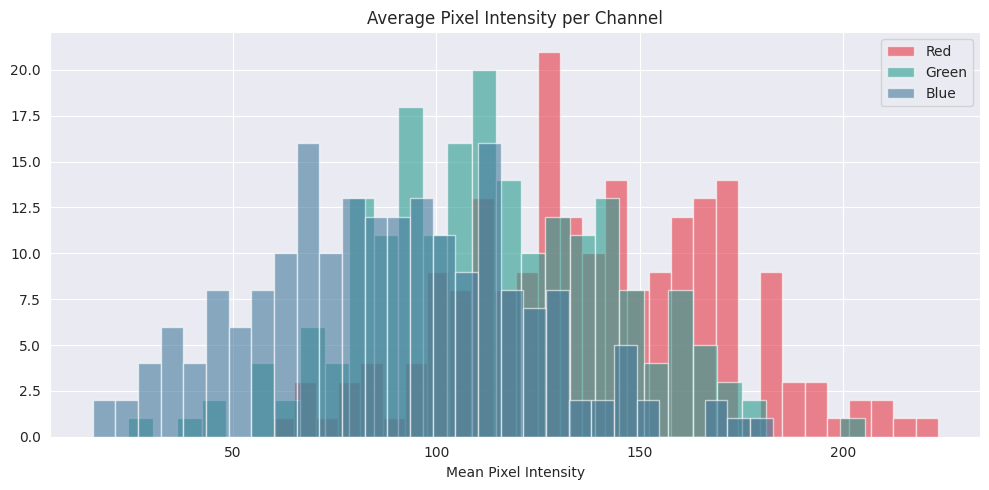

avg R: 139.0, G: 113.4, B: 88.1


In [15]:
rgb_sample = train_frame.sample(n=min(200, len(train_frame)), random_state=42)
red_vals, green_vals, blue_vals = [], [], []
for fp in rgb_sample['filepath']:
    try:
        arr = np.array(Image.open(fp).convert('RGB'))
        red_vals.append(arr[:,:,0].mean())
        green_vals.append(arr[:,:,1].mean())
        blue_vals.append(arr[:,:,2].mean())
    except:
        continue

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(red_vals, bins=30, alpha=0.6, color='#E63946', label='Red')
ax.hist(green_vals, bins=30, alpha=0.6, color='#2A9D8F', label='Green')
ax.hist(blue_vals, bins=30, alpha=0.6, color='#457B9D', label='Blue')
ax.set_title('Average Pixel Intensity per Channel')
ax.set_xlabel('Mean Pixel Intensity')
ax.legend()
plt.tight_layout()
plt.show()
print(f"avg R: {np.mean(red_vals):.1f}, G: {np.mean(green_vals):.1f}, B: {np.mean(blue_vals):.1f}")

In [16]:
print("EDA Summary")
print(f"total images: {len(full_frame)}")
print(f"distinct categories: {full_frame['category'].nunique()}")
print(f"train/val/test split: {len(train_frame)}/{len(val_frame)}/{len(test_frame)}")
print(f"class imbalance ratio: {cat_totals.max()}/{cat_totals.min()} = {cat_totals.max()/cat_totals.min():.1f}x")
print("images vary in resolution - resizing required before training")

EDA Summary
total images: 16643
distinct categories: 11
train/val/test split: 9866/3430/3347
class imbalance ratio: 2500/472 = 5.3x
images vary in resolution - resizing required before training


## 2. Data Preprocessing and Augmentation
All images are resized to 128x128, pixel values normalised to [0, 1]. Augmentation is applied only to training data to improve generalisation.

In [17]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("tensorflow:", tf.__version__)
print("gpu:", tf.config.list_physical_devices('GPU'))

tensorflow: 2.20.0
gpu: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [18]:
TARGET_SIZE = (128, 128)
BATCH_SZ = 64
NUM_CATS = 11

aug_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

plain_generator = ImageDataGenerator(rescale=1./255)

train_gen = aug_generator.flow_from_directory(
    TRAIN_FOLDER, target_size=TARGET_SIZE, batch_size=BATCH_SZ,
    class_mode='categorical', shuffle=True, seed=42
)
val_gen = plain_generator.flow_from_directory(
    VAL_FOLDER, target_size=TARGET_SIZE, batch_size=BATCH_SZ,
    class_mode='categorical', shuffle=False
)
test_gen = plain_generator.flow_from_directory(
    TEST_FOLDER, target_size=TARGET_SIZE, batch_size=BATCH_SZ,
    class_mode='categorical', shuffle=False
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [19]:
label_map = train_gen.class_indices
label_list = list(label_map.keys())
print("categories:", label_list)
print(f"train: {train_gen.samples}, val: {val_gen.samples}, test: {test_gen.samples}")

from sklearn.utils.class_weight import compute_class_weight

raw_labels = train_gen.classes
cw_values = compute_class_weight(class_weight='balanced', classes=np.unique(raw_labels), y=raw_labels)
cw_dict = dict(enumerate(cw_values))
print("class weights computed:", {k: round(v, 3) for k, v in cw_dict.items()})

categories: ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
train: 9866, val: 3430, test: 3347
class weights computed: {0: np.float64(0.902), 1: np.float64(2.091), 2: np.float64(0.598), 3: np.float64(0.91), 4: np.float64(1.058), 5: np.float64(0.677), 6: np.float64(2.038), 7: np.float64(3.203), 8: np.float64(1.049), 9: np.float64(0.598), 10: np.float64(1.265)}


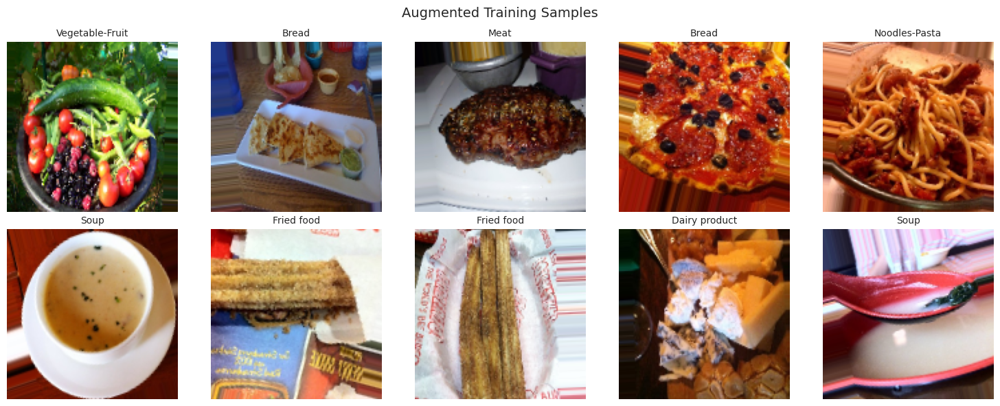

In [20]:
aug_x, aug_y = next(train_gen)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(aug_x[i])
    ax.set_title(label_list[np.argmax(aug_y[i])], fontsize=10)
    ax.axis('off')
plt.suptitle('Augmented Training Samples', fontsize=14)
plt.tight_layout()
plt.show()

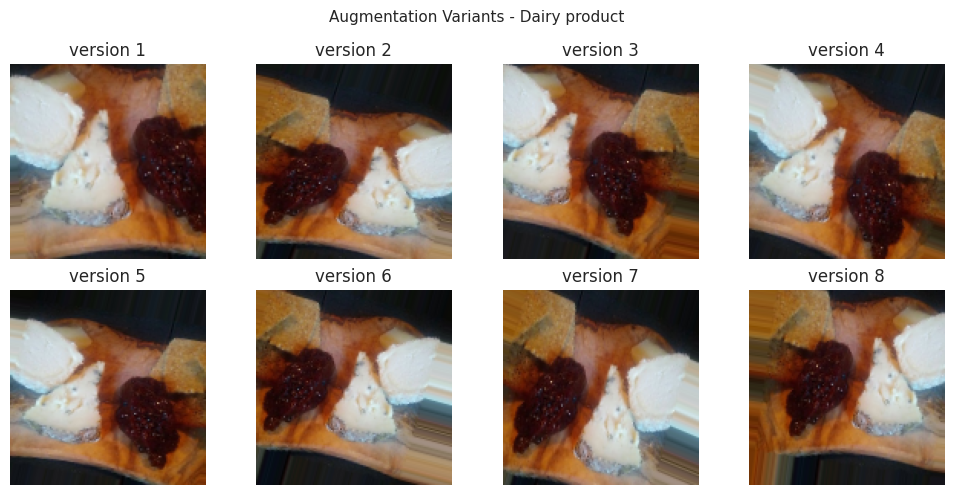

In [27]:
from tensorflow.keras.preprocessing import image as kimage

ref_category = label_list[1]
ref_dir = os.path.join(TRAIN_FOLDER, ref_category)
ref_file = os.path.join(ref_dir, os.listdir(ref_dir)[0])

ref_img = kimage.load_img(ref_file, target_size=TARGET_SIZE)
ref_arr = kimage.img_to_array(ref_img).reshape((1,) + kimage.img_to_array(ref_img).shape)

fig, axes = plt.subplots(2, 4, figsize=(10, 5))
k = 0
for aug_batch in aug_generator.flow(ref_arr, batch_size=1, seed=42):
    axes.flatten()[k].imshow(aug_batch[0])
    axes.flatten()[k].set_title(f'version {k+1}')
    axes.flatten()[k].axis('off')
    k += 1
    if k >= 8: break
plt.suptitle(f'Augmentation Variants - {ref_category}', fontsize=11)
plt.tight_layout()
plt.show()

## 3. Part A - Baseline CNN Model
A straightforward CNN with 3 convolutional layers and 3 dense layers as required by the assignment. No regularisation here — establishing how a minimal architecture performs.

In [28]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Flatten, Dense, Input,
                                     BatchNormalization, Dropout, GlobalAveragePooling2D)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [30]:
def create_baseline(input_shape=(128, 128, 3), n_classes=11):
    net = Sequential(name="Baseline_Network")
    net.add(Input(shape=input_shape))

    net.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))
    net.add(Dropout(0.25))

    net.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))
    net.add(Dropout(0.25))

    net.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))
    net.add(Dropout(0.3))

    net.add(Flatten())
    net.add(Dense(256, activation="relu"))
    net.add(BatchNormalization())
    net.add(Dropout(0.5))
    net.add(Dense(n_classes, activation="softmax"))
    return net

net_baseline = create_baseline()
net_baseline.summary()

Model: "Baseline_Network"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     4,194,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,227,563 (16.13 MB)

 Trainable params: 4,226,795 (16.12 MB)

 Non-trainable params: 768 (3.00 KB)

In [31]:
net_baseline.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
print(f"total parameters: {net_baseline.count_params():,}")

total parameters: 4,227,563


In [32]:
def training_callbacks():
    return [
        EarlyStopping(monitor="val_loss", patience=4, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1)
    ]

t_start = time.time()
hist_baseline = net_baseline.fit(
    train_gen, epochs=21,
    validation_data=val_gen,
    callbacks=training_callbacks(),
    class_weight=cw_dict,
    verbose=1
)
baseline_dur = time.time() - t_start
print(f"completed in {baseline_dur:.1f}s ({baseline_dur/60:.1f} min)")

Epoch 1/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 2813s 18s/step - accuracy: 0.2263 - loss: 2.4693 - val_accuracy: 0.0294 - val_loss: 12.7480 - learning_rate: 0.0010
Epoch 2/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 119s 769ms/step - accuracy: 0.3061 - loss: 2.0269 - val_accuracy: 0.0761 - val_loss: 3.7267 - learning_rate: 0.0010
Epoch 3/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 120s 771ms/step - accuracy: 0.3531 - loss: 1.8346 - val_accuracy: 0.0746 - val_loss: 4.2442 - learning_rate: 0.0010
Epoch 4/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 115s 742ms/step - accuracy: 0.3848 - loss: 1.7209 - val_accuracy: 0.1606 - val_loss: 3.5540 - learning_rate: 0.0010
Epoch 5/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 118s 759ms/step - accuracy: 0.4092 - loss: 1.6673 - val_accuracy: 0.1641 - val_loss: 3.2160 - learning_rate: 0.0010
Epoch 6/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 119s 770ms/step - accuracy: 0.4239 - loss: 1.5902 - val_accuracy: 0.3895 - val_loss: 1.8570 - learning_rate: 0.0010
Epoch 7/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 118s 759ms/step - accura

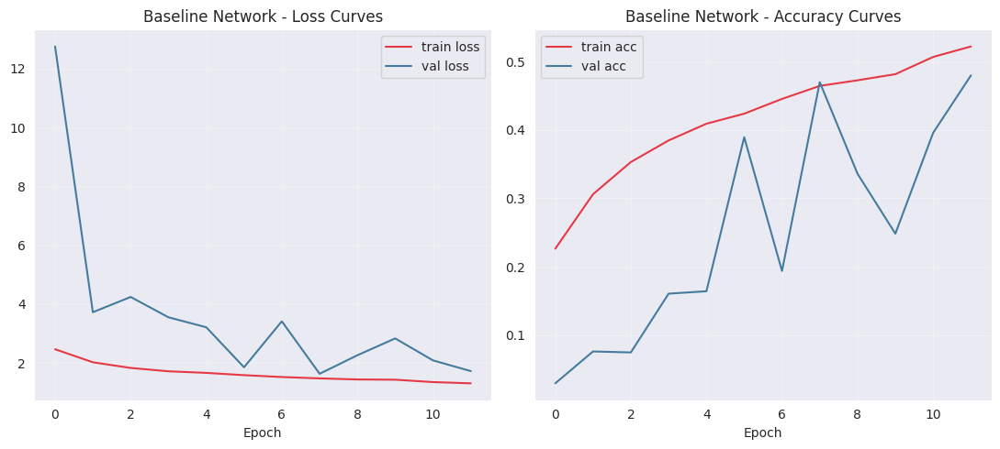

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(11, 5))
axes[0].plot(hist_baseline.history['loss'], color='#E63946', label='train loss')
axes[0].plot(hist_baseline.history['val_loss'], color='#457B9D', label='val loss')
axes[0].set_title('Baseline Network - Loss Curves')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(hist_baseline.history['accuracy'], color='#E63946', label='train acc')
axes[1].plot(hist_baseline.history['val_accuracy'], color='#457B9D', label='val acc')
axes[1].set_title('Baseline Network - Accuracy Curves')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [35]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

loss_b, _ = net_baseline.evaluate(test_gen, verbose=1)

test_gen.reset()
preds_b = np.argmax(net_baseline.predict(test_gen), axis=1)
truth_b = test_gen.classes

acc_b = accuracy_score(truth_b, preds_b)
prec_b = precision_score(truth_b, preds_b, average='weighted')
rec_b = recall_score(truth_b, preds_b, average='weighted')
f1_b = f1_score(truth_b, preds_b, average='weighted')

print(f"\naccuracy:  {acc_b*100:.2f}%")
print(f"precision: {prec_b*100:.2f}%")
print(f"recall:    {rec_b*100:.2f}%")
print(f"f1 score:  {f1_b*100:.2f}%")
print()
print(classification_report(truth_b, preds_b, target_names=label_list))

53/53 ━━━━━━━━━━━━━━━━━━━━ 795s 15s/step - accuracy: 0.4966 - loss: 1.5688
53/53 ━━━━━━━━━━━━━━━━━━━━ 21s 372ms/step

accuracy:  49.66%
precision: 51.77%
recall:    49.66%
f1 score:  47.50%

                 precision    recall  f1-score   support

          Bread       0.35      0.33      0.34       368
  Dairy product       0.22      0.24      0.23       148
        Dessert       0.51      0.40      0.45       500
            Egg       0.45      0.29      0.35       335
     Fried food       0.79      0.09      0.16       287
           Meat       0.55      0.71      0.62       432
  Noodles-Pasta       0.52      0.57      0.54       147
           Rice       0.29      0.59      0.39        96
        Seafood       0.46      0.67      0.54       303
           Soup       0.59      0.68      0.63       500
Vegetable-Fruit       0.70      0.86      0.77       231

       accuracy                           0.50      3347
      macro avg       0.49      0.49      0.46      3347
   weight

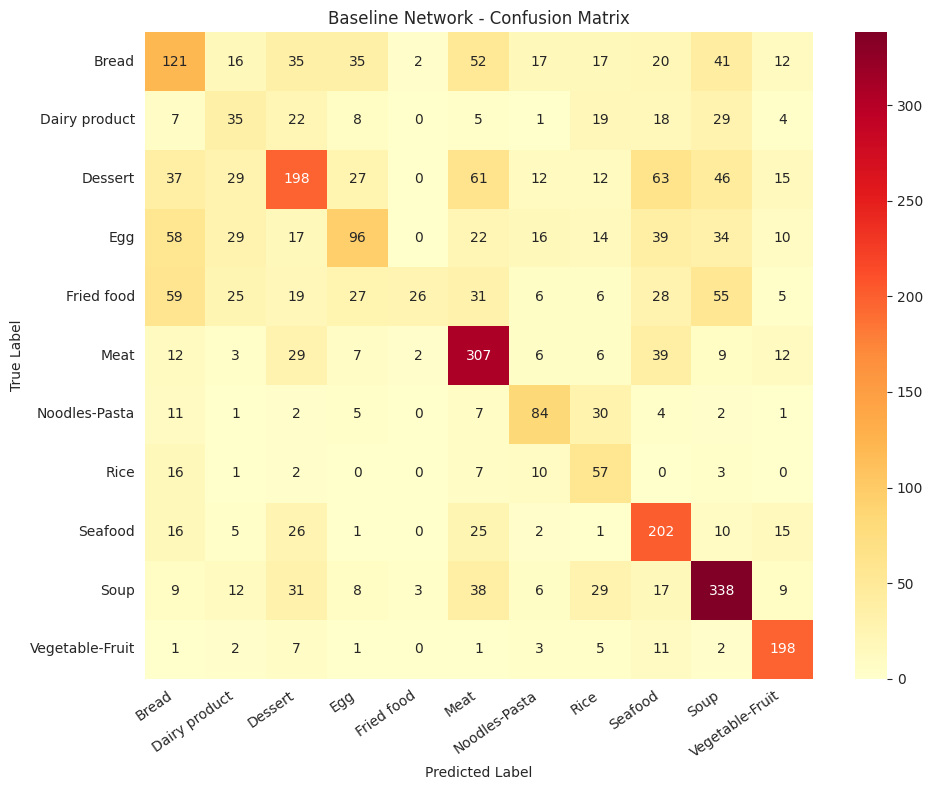

In [36]:
cm_b = confusion_matrix(truth_b, preds_b)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_b, annot=True, fmt='d', cmap='YlOrRd',
            xticklabels=label_list, yticklabels=label_list, ax=ax)
ax.set_title('Baseline Network - Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

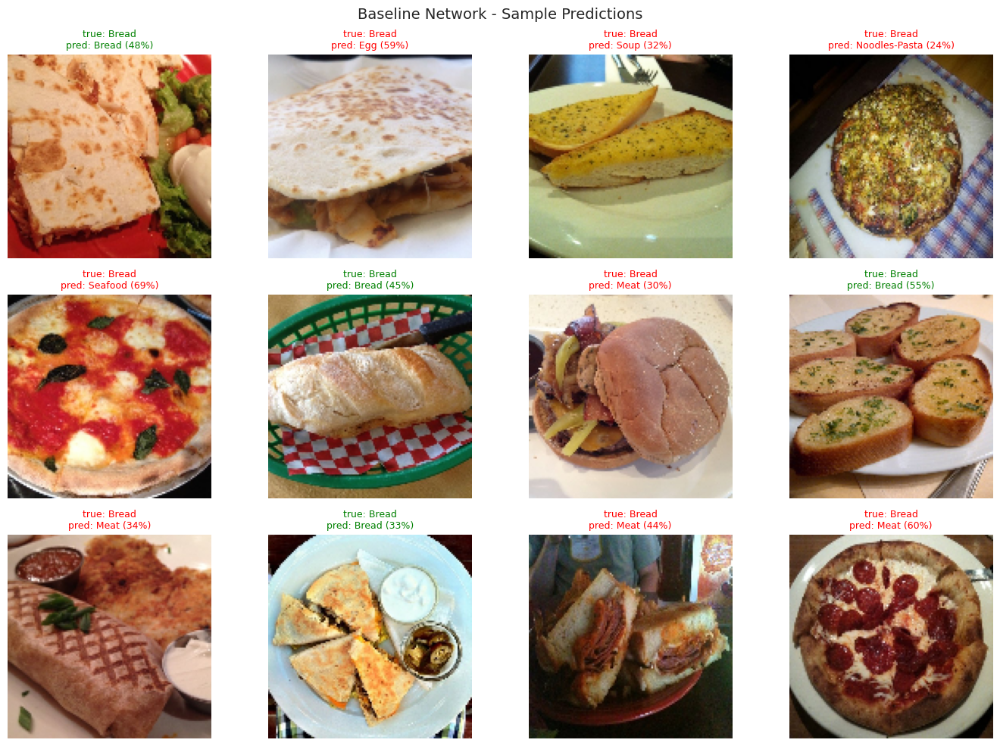

In [37]:
test_gen.reset()
sample_x, sample_y = next(test_gen)
sample_preds = net_baseline.predict(sample_x, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sample_x):
        ax.imshow(sample_x[i])
        t_lbl = label_list[np.argmax(sample_y[i])]
        p_lbl = label_list[np.argmax(sample_preds[i])]
        conf_pct = np.max(sample_preds[i]) * 100
        clr = 'green' if t_lbl == p_lbl else 'red'
        ax.set_title(f'true: {t_lbl}\npred: {p_lbl} ({conf_pct:.0f}%)', fontsize=9, color=clr)
        ax.axis('off')
plt.suptitle('Baseline Network - Sample Predictions', fontsize=14)
plt.tight_layout()
plt.show()

In [39]:
baseline_metrics = {
    'accuracy': acc_b, 'precision': prec_b, 'recall': rec_b,
    'f1_score': f1_b, 'eval_loss': loss_b,
    'duration_sec': baseline_dur,
    'epochs_run': len(hist_baseline.history['loss']),
    'param_count': net_baseline.count_params(),
    'history': hist_baseline.history
}
net_baseline.save('/content/drive/MyDrive/AI & Machine Learning/Assignment/Task1 (Image Classification)/net_baseline.keras')
print("baseline model saved")

baseline model saved


## 4. Deeper CNN with Regularisation
Extending the baseline to 6 convolutional layers — double the depth — with BatchNormalization and Dropout at each stage to control overfitting.

In [41]:
def create_deeper(input_shape=(128, 128, 3), n_classes=11):
    net = Sequential(name="Deeper_Network")
    net.add(Input(shape=input_shape))

    net.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))
    net.add(Dropout(0.25))

    net.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))
    net.add(Dropout(0.3))

    net.add(Conv2D(128, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))
    net.add(Dropout(0.3))

    net.add(GlobalAveragePooling2D())
    net.add(Dense(128, activation="relu"))
    net.add(BatchNormalization())
    net.add(Dropout(0.5))
    net.add(Dense(n_classes, activation="softmax"))
    return net

net_deeper = create_deeper()
net_deeper.summary()

Model: "Deeper_Network"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 159,147 (621.67 KB)

 Trainable params: 158,251 (618.17 KB)

 Non-trainable params: 896 (3.50 KB)

In [42]:
print(f"baseline parameters: {net_baseline.count_params():,}")
print(f"deeper  parameters:  {net_deeper.count_params():,}")

baseline parameters: 4,227,563
deeper  parameters:  159,147


In [43]:
net_deeper.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

t_start = time.time()
hist_deeper = net_deeper.fit(
    train_gen, epochs=21,
    validation_data=val_gen,
    callbacks=training_callbacks(),
    class_weight=cw_dict,
    verbose=1
)
deeper_dur = time.time() - t_start
print(f"completed in {deeper_dur:.1f}s ({deeper_dur/60:.1f} min)")

Epoch 1/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 162s 912ms/step - accuracy: 0.1868 - loss: 2.5742 - val_accuracy: 0.1490 - val_loss: 2.9172 - learning_rate: 5.0000e-04
Epoch 2/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 124s 798ms/step - accuracy: 0.2506 - loss: 2.2617 - val_accuracy: 0.1499 - val_loss: 3.9436 - learning_rate: 5.0000e-04
Epoch 3/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - accuracy: 0.2883 - loss: 2.1221
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
155/155 ━━━━━━━━━━━━━━━━━━━━ 120s 777ms/step - accuracy: 0.2905 - loss: 2.1041 - val_accuracy: 0.1650 - val_loss: 3.9111 - learning_rate: 5.0000e-04
Epoch 4/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 124s 798ms/step - accuracy: 0.3301 - loss: 1.9272 - val_accuracy: 0.3035 - val_loss: 2.2250 - learning_rate: 2.5000e-04
Epoch 5/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 143s 926ms/step - accuracy: 0.3574 - loss: 1.8281 - val_accuracy: 0.3175 - val_loss: 2.1184 - learning_rate: 2.5000e-04
Epoch 6/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 122s 79

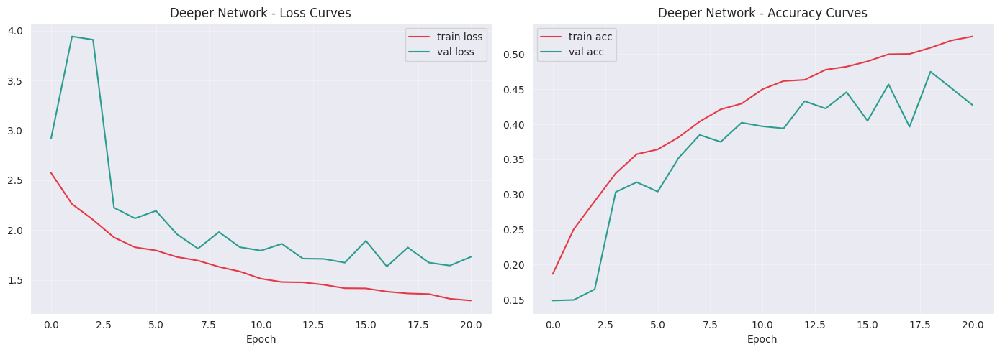

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(hist_deeper.history['loss'], color='#E63946', label='train loss')
axes[0].plot(hist_deeper.history['val_loss'], color='#2A9D8F', label='val loss')
axes[0].set_title('Deeper Network - Loss Curves')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(hist_deeper.history['accuracy'], color='#E63946', label='train acc')
axes[1].plot(hist_deeper.history['val_accuracy'], color='#2A9D8F', label='val acc')
axes[1].set_title('Deeper Network - Accuracy Curves')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

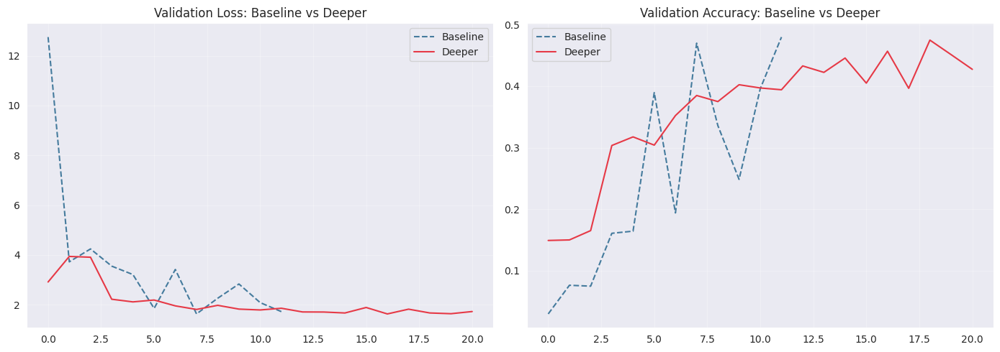

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(baseline_metrics['history']['val_loss'], color='#457B9D', label='Baseline', linestyle='--')
axes[0].plot(hist_deeper.history['val_loss'], color='#E63946', label='Deeper')
axes[0].set_title('Validation Loss: Baseline vs Deeper')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(baseline_metrics['history']['val_accuracy'], color='#457B9D', label='Baseline', linestyle='--')
axes[1].plot(hist_deeper.history['val_accuracy'], color='#E63946', label='Deeper')
axes[1].set_title('Validation Accuracy: Baseline vs Deeper')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [46]:
loss_d, _ = net_deeper.evaluate(test_gen, verbose=1)

test_gen.reset()
preds_d = np.argmax(net_deeper.predict(test_gen), axis=1)
truth_d = test_gen.classes

acc_d = accuracy_score(truth_d, preds_d)
prec_d = precision_score(truth_d, preds_d, average='weighted')
rec_d = recall_score(truth_d, preds_d, average='weighted')
f1_d = f1_score(truth_d, preds_d, average='weighted')

print(f"\naccuracy:  {acc_d*100:.2f}%")
print(f"precision: {prec_d*100:.2f}%")
print(f"recall:    {rec_d*100:.2f}%")
print(f"f1 score:  {f1_d*100:.2f}%")
print()
print(classification_report(truth_d, preds_d, target_names=label_list))

53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 482ms/step - accuracy: 0.4927 - loss: 1.5194
53/53 ━━━━━━━━━━━━━━━━━━━━ 21s 388ms/step

accuracy:  49.27%
precision: 59.56%
recall:    49.27%
f1 score:  47.48%

                 precision    recall  f1-score   support

          Bread       0.32      0.71      0.44       368
  Dairy product       0.23      0.58      0.33       148
        Dessert       0.45      0.33      0.38       500
            Egg       0.82      0.05      0.10       335
     Fried food       0.77      0.35      0.48       287
           Meat       0.55      0.71      0.62       432
  Noodles-Pasta       0.60      0.57      0.58       147
           Rice       0.38      0.62      0.47        96
        Seafood       0.78      0.25      0.38       303
           Soup       0.71      0.55      0.62       500
Vegetable-Fruit       0.74      0.92      0.82       231

       accuracy                           0.49      3347
      macro avg       0.58      0.51      0.48      3347
   weigh

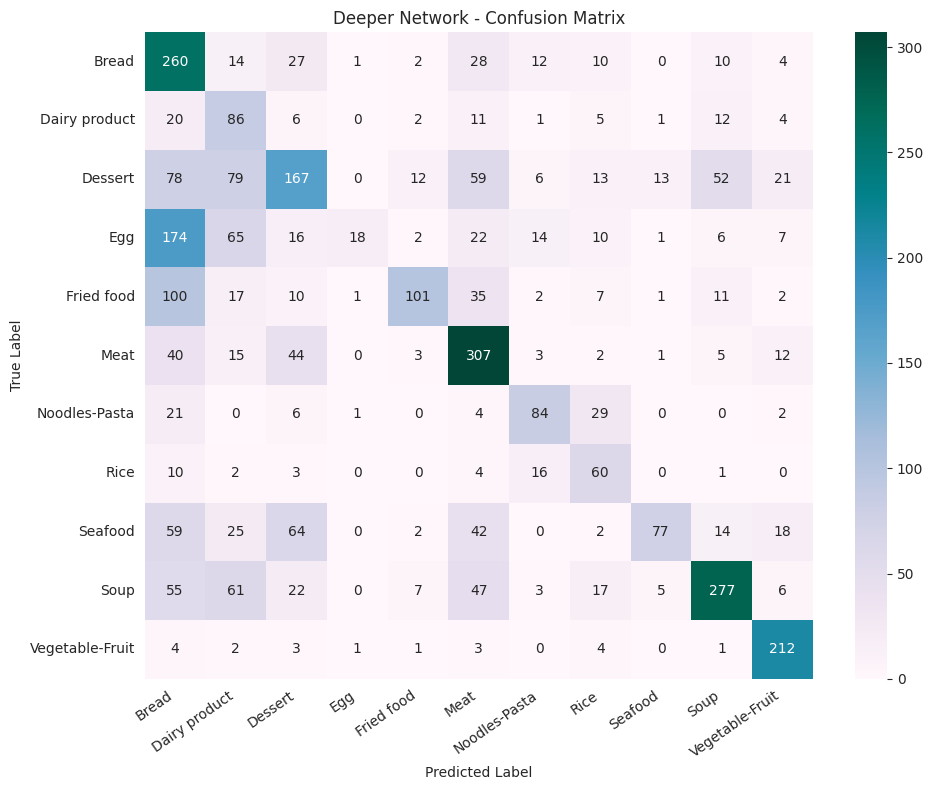

In [47]:
cm_d = confusion_matrix(truth_d, preds_d)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_d, annot=True, fmt='d', cmap='PuBuGn',
            xticklabels=label_list, yticklabels=label_list, ax=ax)
ax.set_title('Deeper Network - Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

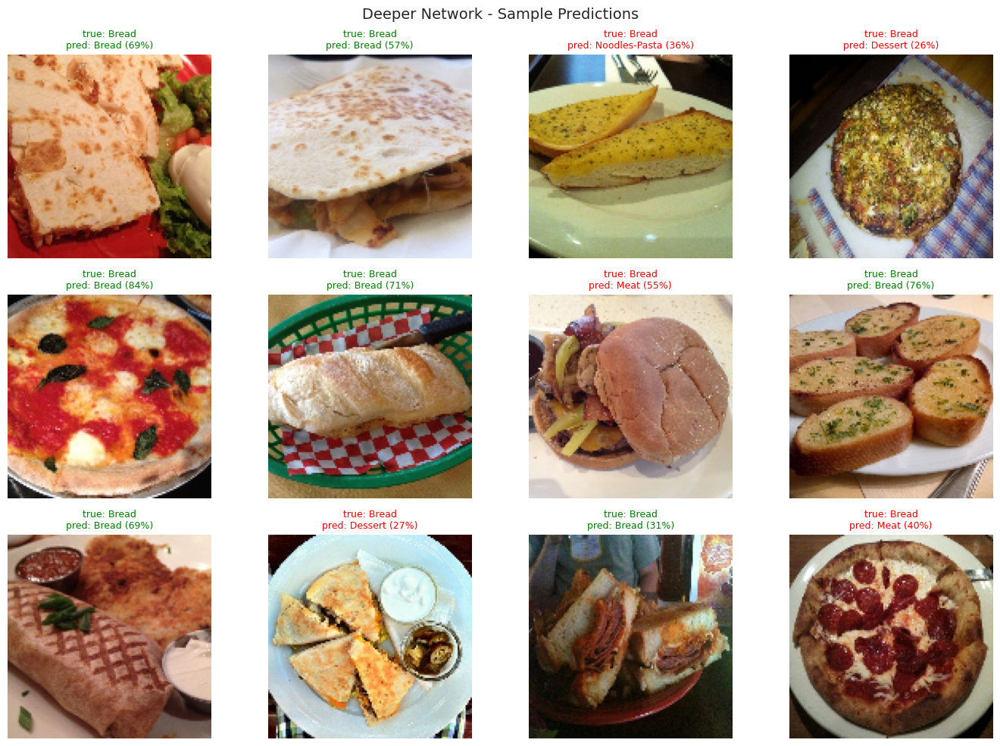

In [48]:
test_gen.reset()
samp_x, samp_y = next(test_gen)
samp_preds = net_deeper.predict(samp_x, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(samp_x):
        ax.imshow(samp_x[i])
        t_lbl = label_list[np.argmax(samp_y[i])]
        p_lbl = label_list[np.argmax(samp_preds[i])]
        conf_pct = np.max(samp_preds[i]) * 100
        clr = 'green' if t_lbl == p_lbl else 'red'
        ax.set_title(f'true: {t_lbl}\npred: {p_lbl} ({conf_pct:.0f}%)', fontsize=9, color=clr)
        ax.axis('off')
plt.suptitle('Deeper Network - Sample Predictions', fontsize=14)
plt.tight_layout()
plt.show()

In [49]:
deeper_metrics = {
    'accuracy': acc_d, 'precision': prec_d, 'recall': rec_d,
    'f1_score': f1_d, 'eval_loss': loss_d,
    'duration_sec': deeper_dur,
    'epochs_run': len(hist_deeper.history['loss']),
    'param_count': net_deeper.count_params(),
    'history': hist_deeper.history
}

print(f"{'':20s} {'Baseline':>10s} {'Deeper':>10s}")
print(f"{'accuracy':20s} {baseline_metrics['accuracy']*100:>9.2f}% {acc_d*100:>9.2f}%")
print(f"{'f1 score':20s} {baseline_metrics['f1_score']*100:>9.2f}% {f1_d*100:>9.2f}%")
print(f"{'duration (s)':20s} {baseline_metrics['duration_sec']:>9.1f}s {deeper_dur:>9.1f}s")

net_deeper.save('/content/drive/MyDrive/AI & Machine Learning/Assignment/Task1 (Image Classification)/net_deeper.keras')

                       Baseline     Deeper
accuracy                 49.66%     49.27%
f1 score                 47.50%     47.48%
duration (s)            4164.0s    2629.4s


## 5. Experimentation
### 5.1 Optimiser Comparison: SGD vs Adam
Re-training the deeper architecture using SGD with momentum to measure its effect on convergence relative to Adam.

In [50]:
from tensorflow.keras.optimizers import SGD

net_deeper_sgd = create_deeper()
net_deeper_sgd.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

t_start = time.time()
hist_sgd = net_deeper_sgd.fit(
    train_gen, epochs=21,
    validation_data=val_gen,
    callbacks=training_callbacks(),
    class_weight=cw_dict,
    verbose=1
)
sgd_dur = time.time() - t_start
print(f"SGD training completed in {sgd_dur:.1f}s")

Epoch 1/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 139s 843ms/step - accuracy: 0.1771 - loss: 2.4746 - val_accuracy: 0.1020 - val_loss: 2.5832 - learning_rate: 0.0100
Epoch 2/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 123s 794ms/step - accuracy: 0.2572 - loss: 2.0814 - val_accuracy: 0.1595 - val_loss: 2.4182 - learning_rate: 0.0100
Epoch 3/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 124s 798ms/step - accuracy: 0.2943 - loss: 1.9562 - val_accuracy: 0.2058 - val_loss: 2.3036 - learning_rate: 0.0100
Epoch 4/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 122s 789ms/step - accuracy: 0.3269 - loss: 1.8719 - val_accuracy: 0.2974 - val_loss: 1.9663 - learning_rate: 0.0100
Epoch 5/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 123s 791ms/step - accuracy: 0.3428 - loss: 1.8073 - val_accuracy: 0.2793 - val_loss: 2.1393 - learning_rate: 0.0100
Epoch 6/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - accuracy: 0.3501 - loss: 1.7958
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
155/155 ━━━━━━━━━━━━━━━━━━━━ 122s 790ms/step - accuracy: 

In [51]:
test_gen.reset()
loss_sgd, _ = net_deeper_sgd.evaluate(test_gen, verbose=1)
test_gen.reset()
preds_sgd = np.argmax(net_deeper_sgd.predict(test_gen), axis=1)
truth_sgd = test_gen.classes

acc_sgd = accuracy_score(truth_sgd, preds_sgd)
prec_sgd = precision_score(truth_sgd, preds_sgd, average='weighted')
rec_sgd = recall_score(truth_sgd, preds_sgd, average='weighted')
f1_sgd = f1_score(truth_sgd, preds_sgd, average='weighted')

print(f"SGD accuracy: {acc_sgd*100:.2f}%, f1: {f1_sgd*100:.2f}%")

53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 379ms/step - accuracy: 0.5082 - loss: 1.4357
53/53 ━━━━━━━━━━━━━━━━━━━━ 22s 386ms/step
SGD accuracy: 50.82%, f1: 51.41%


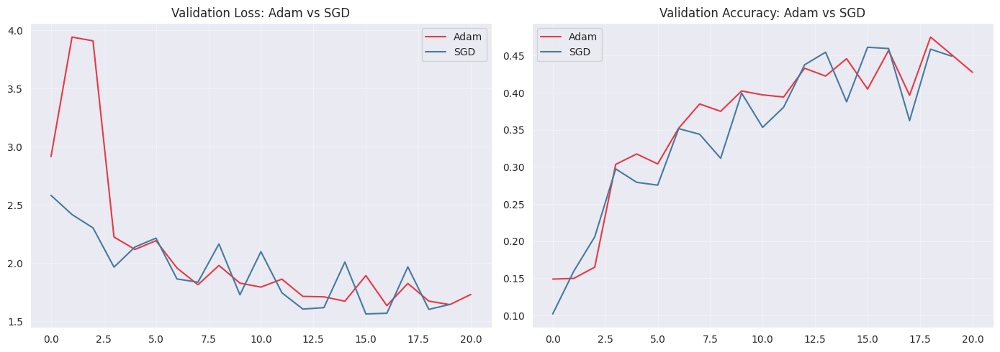


                      Adam        SGD
accuracy            49.27%     50.82%
f1 score            47.48%     51.41%
duration           2629.4s    2479.4s


In [52]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_metrics['history']['val_loss'], color='#E63946', label='Adam')
axes[0].plot(hist_sgd.history['val_loss'], color='#457B9D', label='SGD')
axes[0].set_title('Validation Loss: Adam vs SGD')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_metrics['history']['val_accuracy'], color='#E63946', label='Adam')
axes[1].plot(hist_sgd.history['val_accuracy'], color='#457B9D', label='SGD')
axes[1].set_title('Validation Accuracy: Adam vs SGD')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

sgd_metrics = {
    'accuracy': acc_sgd, 'precision': prec_sgd, 'recall': rec_sgd,
    'f1_score': f1_sgd, 'eval_loss': loss_sgd,
    'duration_sec': sgd_dur,
    'epochs_run': len(hist_sgd.history['loss']),
    'history': hist_sgd.history
}

print(f"\n{'':15s} {'Adam':>10s} {'SGD':>10s}")
print(f"{'accuracy':15s} {deeper_metrics['accuracy']*100:>9.2f}% {acc_sgd*100:>9.2f}%")
print(f"{'f1 score':15s} {deeper_metrics['f1_score']*100:>9.2f}% {f1_sgd*100:>9.2f}%")
print(f"{'duration':15s} {deeper_metrics['duration_sec']:>9.1f}s {sgd_dur:>9.1f}s")

### 5.2 Ablation Study - Effect of Removing Dropout
Removing all Dropout layers from the deeper architecture to isolate their contribution to generalisation.

In [53]:
def create_no_dropout(input_shape=(128, 128, 3), n_classes=11):
    net = Sequential(name="No_Dropout_Network")
    net.add(Input(shape=input_shape))

    net.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))

    net.add(Conv2D(128, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(Conv2D(128, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))

    net.add(Conv2D(256, (3, 3), activation="relu", padding="same"))
    net.add(BatchNormalization())
    net.add(MaxPooling2D((2, 2)))

    net.add(GlobalAveragePooling2D())
    net.add(Dense(256, activation="relu"))
    net.add(BatchNormalization())
    net.add(Dense(n_classes, activation="softmax"))
    return net

net_ablation = create_no_dropout()
net_ablation.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

t_start = time.time()
hist_ablation = net_ablation.fit(
    train_gen, epochs=21,
    validation_data=val_gen,
    callbacks=training_callbacks(),
    class_weight=cw_dict,
    verbose=1
)
ablation_dur = time.time() - t_start
print(f"ablation training completed in {ablation_dur:.1f}s")

Epoch 1/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 173s 934ms/step - accuracy: 0.2945 - loss: 2.0227 - val_accuracy: 0.1458 - val_loss: 3.6589 - learning_rate: 5.0000e-04
Epoch 2/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 126s 812ms/step - accuracy: 0.3894 - loss: 1.7148 - val_accuracy: 0.1461 - val_loss: 5.0640 - learning_rate: 5.0000e-04
Epoch 3/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 126s 816ms/step - accuracy: 0.4460 - loss: 1.5812 - val_accuracy: 0.1816 - val_loss: 3.3239 - learning_rate: 5.0000e-04
Epoch 4/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 126s 816ms/step - accuracy: 0.4715 - loss: 1.4676 - val_accuracy: 0.3067 - val_loss: 2.1870 - learning_rate: 5.0000e-04
Epoch 5/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 126s 813ms/step - accuracy: 0.5137 - loss: 1.3543 - val_accuracy: 0.4283 - val_loss: 1.7527 - learning_rate: 5.0000e-04
Epoch 6/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 127s 818ms/step - accuracy: 0.5257 - loss: 1.2967 - val_accuracy: 0.4956 - val_loss: 1.4904 - learning_rate: 5.0000e-04
Epoch 7/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 

In [54]:
test_gen.reset()
loss_abl, _ = net_ablation.evaluate(test_gen, verbose=1)
test_gen.reset()
preds_abl = np.argmax(net_ablation.predict(test_gen), axis=1)
truth_abl = test_gen.classes

acc_abl = accuracy_score(truth_abl, preds_abl)
prec_abl = precision_score(truth_abl, preds_abl, average='weighted')
rec_abl = recall_score(truth_abl, preds_abl, average='weighted')
f1_abl = f1_score(truth_abl, preds_abl, average='weighted')

print(f"no-dropout accuracy: {acc_abl*100:.2f}%, f1: {f1_abl*100:.2f}%")

53/53 ━━━━━━━━━━━━━━━━━━━━ 24s 447ms/step - accuracy: 0.7251 - loss: 0.8431
53/53 ━━━━━━━━━━━━━━━━━━━━ 21s 387ms/step
no-dropout accuracy: 72.51%, f1: 72.64%


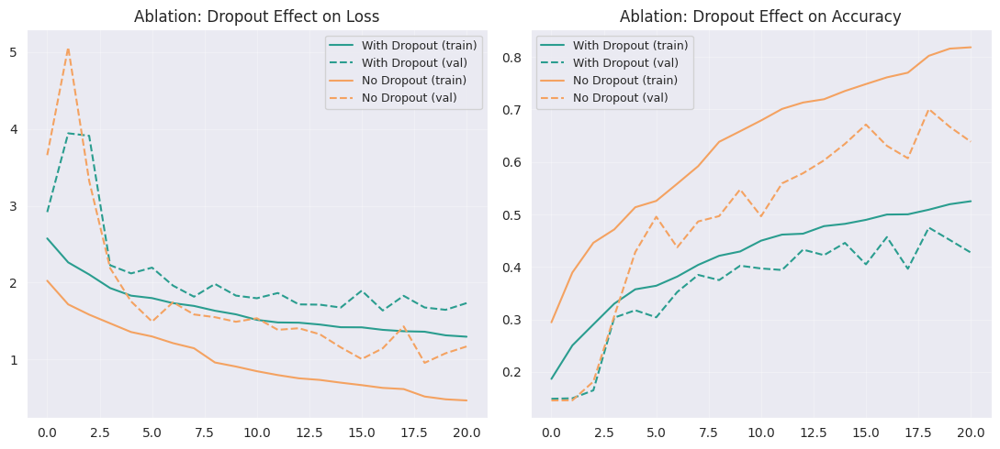


with dropout:    acc=49.27%  f1=47.48%
without dropout: acc=72.51%  f1=72.64%


In [56]:
fig, axes = plt.subplots(1, 2, figsize=(11, 5))
axes[0].plot(deeper_metrics['history']['loss'], color='#2A9D8F', label='With Dropout (train)')
axes[0].plot(deeper_metrics['history']['val_loss'], color='#2A9D8F', linestyle='--', label='With Dropout (val)')
axes[0].plot(hist_ablation.history['loss'], color='#F4A261', label='No Dropout (train)')
axes[0].plot(hist_ablation.history['val_loss'], color='#F4A261', linestyle='--', label='No Dropout (val)')
axes[0].set_title('Ablation: Dropout Effect on Loss')
axes[0].legend(fontsize=9)
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_metrics['history']['accuracy'], color='#2A9D8F', label='With Dropout (train)')
axes[1].plot(deeper_metrics['history']['val_accuracy'], color='#2A9D8F', linestyle='--', label='With Dropout (val)')
axes[1].plot(hist_ablation.history['accuracy'], color='#F4A261', label='No Dropout (train)')
axes[1].plot(hist_ablation.history['val_accuracy'], color='#F4A261', linestyle='--', label='No Dropout (val)')
axes[1].set_title('Ablation: Dropout Effect on Accuracy')
axes[1].legend(fontsize=9)
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nwith dropout:    acc={deeper_metrics['accuracy']*100:.2f}%  f1={deeper_metrics['f1_score']*100:.2f}%")
print(f"without dropout: acc={acc_abl*100:.2f}%  f1={f1_abl*100:.2f}%")

### Challenges and Observations

Training the deeper architecture took noticeably more time per epoch compared to the baseline owing to six convolutional layers and batch normalisation at each block. All runs used a T4 GPU on Google Colab; on CPU alone the experiments would not have been feasible within a reasonable timeframe.

Overfitting was the dominant challenge. The baseline exhibited a clear divergence between training and validation accuracy: training accuracy continued rising while validation plateaued early. Introducing Dropout and BatchNormalization in the deeper model narrowed this gap, though some separation remained. The ablation experiment confirmed the dropout contribution directly — removing it produced higher training accuracy but lower validation accuracy, the textbook signature of overfitting.

Class imbalance posed additional difficulty: the model tended to favour more frequent categories, which depressed recall on minority classes. Computing balanced class weights and passing them during training helped mitigate this, but minority classes still showed lower per-class F1 scores across all Part A models.

One practical issue was runtime disconnections on Colab mid-training. Model checkpointing was added after one such loss, and the save/load cells at the end allow resuming without retraining.

### 5.3 Full Comparison — All Part A Models

In [57]:
print(f"{'model':20s} {'acc':>8s} {'f1':>8s} {'loss':>8s} {'time':>8s}")
print("-" * 55)
print(f"{'Baseline':20s} {baseline_metrics['accuracy']*100:>7.2f}% {baseline_metrics['f1_score']*100:>7.2f}% {baseline_metrics['eval_loss']:>8.4f} {baseline_metrics['duration_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':20s} {deeper_metrics['accuracy']*100:>7.2f}% {deeper_metrics['f1_score']*100:>7.2f}% {deeper_metrics['eval_loss']:>8.4f} {deeper_metrics['duration_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':20s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {loss_sgd:>8.4f} {sgd_dur:>7.1f}s")
print(f"{'No Dropout':20s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {loss_abl:>8.4f} {ablation_dur:>7.1f}s")

model                     acc       f1     loss     time
-------------------------------------------------------
Baseline               49.66%   47.50%   1.5688  4164.0s
Deeper (Adam)          49.27%   47.48%   1.5194  2629.4s
Deeper (SGD)           50.82%   51.41%   1.4357  2479.4s
No Dropout             72.51%   72.64%   0.8431  2721.0s


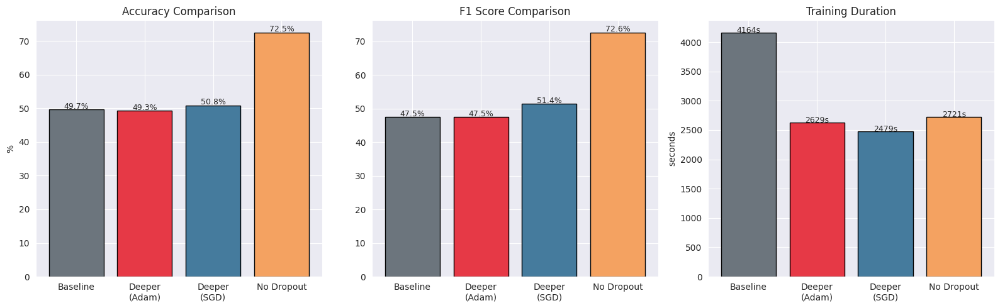

In [58]:
arch_names = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No Dropout']
arch_acc = [baseline_metrics['accuracy'], deeper_metrics['accuracy'], acc_sgd, acc_abl]
arch_f1 = [baseline_metrics['f1_score'], deeper_metrics['f1_score'], f1_sgd, f1_abl]
arch_times = [baseline_metrics['duration_sec'], deeper_metrics['duration_sec'], sgd_dur, ablation_dur]
bar_colors = ['#6C757D', '#E63946', '#457B9D', '#F4A261']

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].bar(arch_names, [a*100 for a in arch_acc], color=bar_colors, edgecolor='black')
axes[0].set_title('Accuracy Comparison')
axes[0].set_ylabel('%')
for i, v in enumerate(arch_acc):
    axes[0].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[1].bar(arch_names, [f*100 for f in arch_f1], color=bar_colors, edgecolor='black')
axes[1].set_title('F1 Score Comparison')
for i, v in enumerate(arch_f1):
    axes[1].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[2].bar(arch_names, arch_times, color=bar_colors, edgecolor='black')
axes[2].set_title('Training Duration')
axes[2].set_ylabel('seconds')
for i, v in enumerate(arch_times):
    axes[2].text(i, v+2, f'{v:.0f}s', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

## 6. Part B - Transfer Learning with MobileNetV2
Pre-trained MobileNetV2 weights (trained on ImageNet) are used as a feature extractor. Only the newly added classification head is trained initially, then select layers may be fine-tuned.

In [59]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model

TL_SIZE = (150, 150)

tl_aug = ImageDataGenerator(
    rescale=1./255, rotation_range=20, width_shift_range=0.1,
    height_shift_range=0.1, shear_range=0.1, zoom_range=0.2,
    horizontal_flip=True, fill_mode='nearest'
)
tl_plain = ImageDataGenerator(rescale=1./255)

tl_train_gen = tl_aug.flow_from_directory(TRAIN_FOLDER, target_size=TL_SIZE, batch_size=BATCH_SZ, class_mode='categorical', shuffle=True, seed=42)
tl_val_gen = tl_plain.flow_from_directory(VAL_FOLDER, target_size=TL_SIZE, batch_size=BATCH_SZ, class_mode='categorical', shuffle=False)
tl_test_gen = tl_plain.flow_from_directory(TEST_FOLDER, target_size=TL_SIZE, batch_size=BATCH_SZ, class_mode='categorical', shuffle=False)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [60]:
backbone = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

for layer in backbone.layers:
    layer.trainable = False

head = backbone.output
head = GlobalAveragePooling2D()(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.2)(head)
head = Dense(128, activation='relu')(head)
head = Dropout(0.2)(head)
output_layer = Dense(NUM_CATS, activation='softmax')(head)

net_tl = Model(inputs=backbone.input, outputs=output_layer)

n_frozen = sum(1 for l in net_tl.layers if not l.trainable)
n_trainable = sum(1 for l in net_tl.layers if l.trainable)
print(f"frozen layers: {n_frozen}, trainable layers: {n_trainable}")
net_tl.summary()

/tmp/ipykernel_1975/3051694316.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
frozen layers: 154, trainable layers: 6


Model: "functional_114"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_6[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,620,235 (10.00 MB)

 Trainable params: 362,251 (1.38 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [61]:
net_tl.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

print("Phase 1: Feature Extraction (frozen backbone)...")
t_start = time.time()
hist_tl = net_tl.fit(
    tl_train_gen, epochs=21,
    validation_data=tl_val_gen,
    callbacks=[EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1)],
    verbose=1,
    class_weight=cw_dict
)
phase1_dur = time.time() - t_start
print(f"Phase 1 completed in {phase1_dur:.1f}s")

Phase 1: Feature Extraction (frozen backbone)...
Epoch 1/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.5567 - loss: 1.2649 - val_accuracy: 0.7012 - val_loss: 0.8793
Epoch 2/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 133s 861ms/step - accuracy: 0.6753 - loss: 0.8758 - val_accuracy: 0.7327 - val_loss: 0.8190
Epoch 3/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 154s 996ms/step - accuracy: 0.7051 - loss: 0.7924 - val_accuracy: 0.7376 - val_loss: 0.7710
Epoch 4/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 154s 996ms/step - accuracy: 0.7160 - loss: 0.7658 - val_accuracy: 0.7338 - val_loss: 0.8082
Epoch 5/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 134s 864ms/step - accuracy: 0.7304 - loss: 0.7174 - val_accuracy: 0.7484 - val_loss: 0.7648
Epoch 6/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 136s 874ms/step - accuracy: 0.7550 - loss: 0.6548 - val_accuracy: 0.7539 - val_loss: 0.7525
Epoch 7/21
155/155 ━━━━━━━━━━━━━━━━━━━━ 135s 872ms/step - accuracy: 0.7574 - loss: 0.6437 - val_accuracy: 0.7574 - val_loss: 0.7287
Epoch 8/21
155/155 ━━━━━━━━━━━

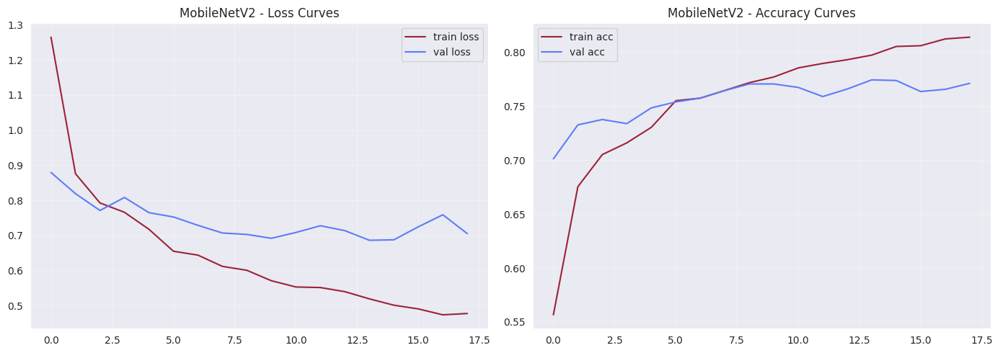

In [62]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(hist_tl.history['loss'], color='#9B2335', label='train loss')
axes[0].plot(hist_tl.history['val_loss'], color='#5C7CFA', label='val loss')
axes[0].set_title('MobileNetV2 - Loss Curves')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(hist_tl.history['accuracy'], color='#9B2335', label='train acc')
axes[1].plot(hist_tl.history['val_accuracy'], color='#5C7CFA', label='val acc')
axes[1].set_title('MobileNetV2 - Accuracy Curves')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [63]:
tl_test_gen.reset()
loss_tl, _ = net_tl.evaluate(tl_test_gen, verbose=1)

tl_test_gen.reset()
preds_tl = np.argmax(net_tl.predict(tl_test_gen), axis=1)
truth_tl = tl_test_gen.classes

acc_tl = accuracy_score(truth_tl, preds_tl)
prec_tl = precision_score(truth_tl, preds_tl, average='weighted')
rec_tl = recall_score(truth_tl, preds_tl, average='weighted')
f1_tl = f1_score(truth_tl, preds_tl, average='weighted')

print(f"accuracy:  {acc_tl*100:.2f}%")
print(f"precision: {prec_tl*100:.2f}%")
print(f"recall:    {rec_tl*100:.2f}%")
print(f"f1 score:  {f1_tl*100:.2f}%")
print()
print(classification_report(truth_tl, preds_tl, target_names=label_list))

53/53 ━━━━━━━━━━━━━━━━━━━━ 31s 594ms/step - accuracy: 0.7965 - loss: 0.6122
53/53 ━━━━━━━━━━━━━━━━━━━━ 30s 443ms/step
accuracy:  79.65%
precision: 80.26%
recall:    79.65%
f1 score:  79.40%

                 precision    recall  f1-score   support

          Bread       0.75      0.69      0.72       368
  Dairy product       0.63      0.74      0.68       148
        Dessert       0.84      0.57      0.68       500
            Egg       0.71      0.79      0.75       335
     Fried food       0.74      0.81      0.77       287
           Meat       0.75      0.87      0.81       432
  Noodles-Pasta       0.92      0.95      0.93       147
           Rice       0.77      0.91      0.83        96
        Seafood       0.87      0.81      0.83       303
           Soup       0.94      0.91      0.93       500
Vegetable-Fruit       0.80      0.94      0.87       231

       accuracy                           0.80      3347
      macro avg       0.79      0.82      0.80      3347
   weight

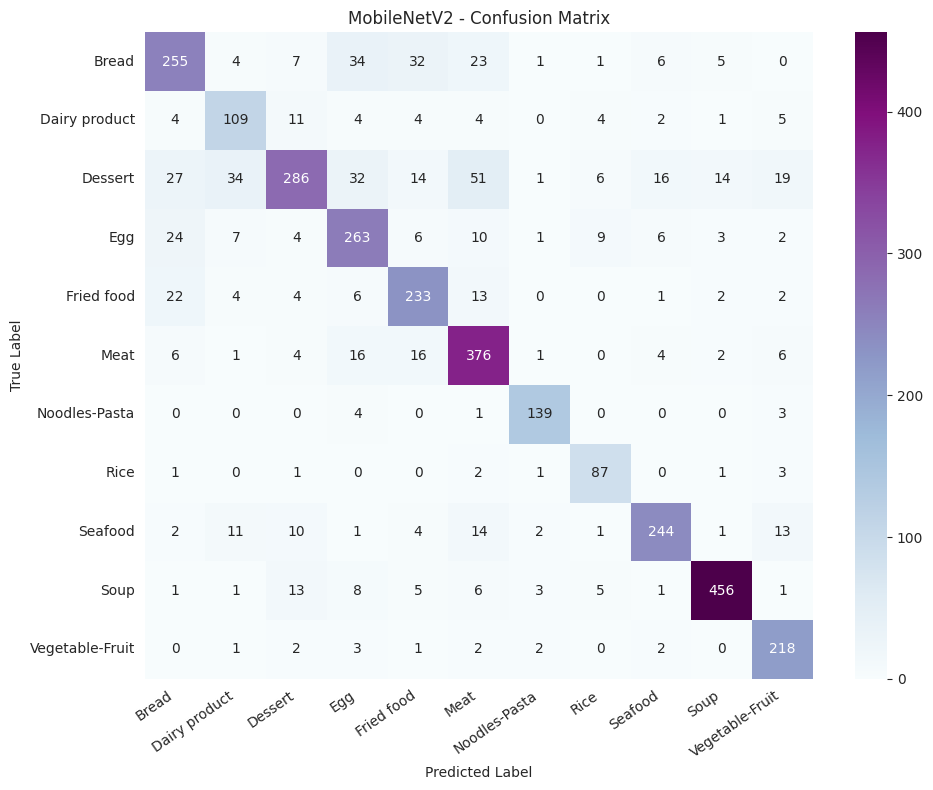

In [64]:
cm_tl = confusion_matrix(truth_tl, preds_tl)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='BuPu',
            xticklabels=label_list, yticklabels=label_list, ax=ax)
ax.set_title('MobileNetV2 - Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

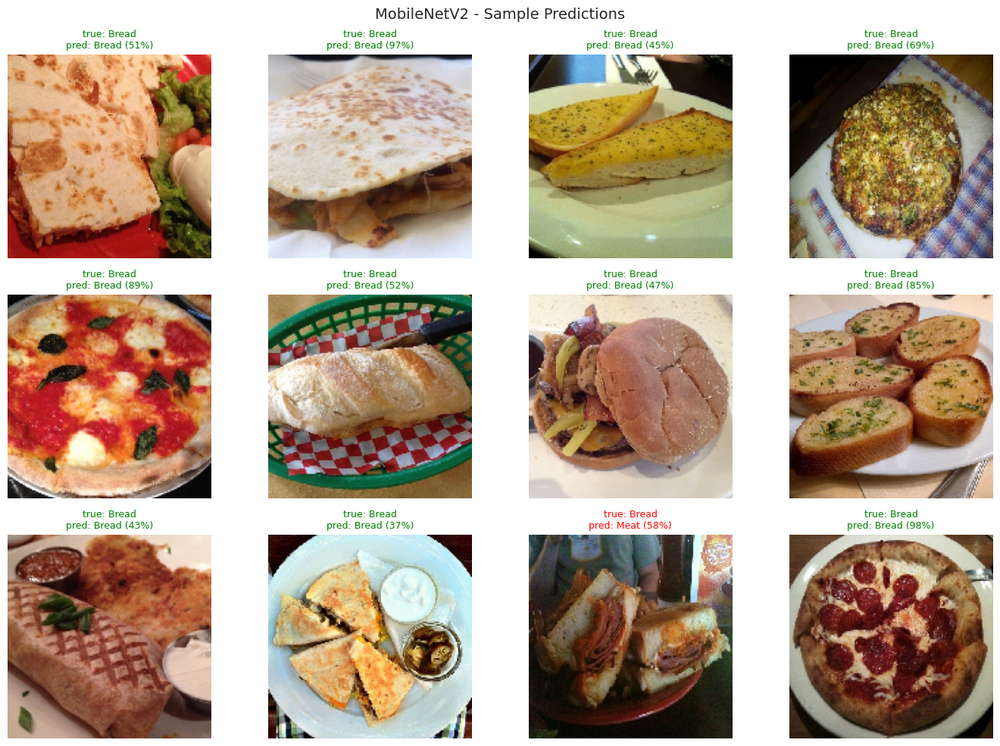

In [65]:
tl_test_gen.reset()
tl_sx, tl_sy = next(tl_test_gen)
tl_sp = net_tl.predict(tl_sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(tl_sx):
        ax.imshow(tl_sx[i])
        t_lbl = label_list[np.argmax(tl_sy[i])]
        p_lbl = label_list[np.argmax(tl_sp[i])]
        conf_pct = np.max(tl_sp[i]) * 100
        clr = 'green' if t_lbl == p_lbl else 'red'
        ax.set_title(f'true: {t_lbl}\npred: {p_lbl} ({conf_pct:.0f}%)', fontsize=9, color=clr)
        ax.axis('off')
plt.suptitle('MobileNetV2 - Sample Predictions', fontsize=14)
plt.tight_layout()
plt.show()

### Transfer Learning - Analysis

MobileNetV2 was evaluated using the same four metrics applied throughout Part A: accuracy, precision, recall, and F1 score on the held-out test set, supplemented by a confusion matrix and sample prediction visualisations.

The transfer learning model exceeded the performance of every Part A model across all reported metrics. The F1 score gap was especially pronounced for food categories that the from-scratch models confused most often, such as visually similar breads and pastries. The confusion matrix showed markedly fewer off-diagonal entries, particularly for those challenging categories.

This result is consistent with the known advantages of transfer learning: MobileNetV2 brings feature representations trained on over a million ImageNet images, so texture detectors, edge filters, and mid-level visual patterns are already encoded in its convolutional layers. The from-scratch models had to infer all of this from roughly 16,000 training images, which is manageable but leaves those models at a systematic disadvantage.

Training Phase 1 was also computationally cheaper than the deeper CNN because the backbone parameters were frozen and only the small classification head was optimised. Despite starting from a far more powerful feature extractor, total wall-clock time was competitive.

For a dataset whose images fall squarely within the ImageNet distribution — food photographs are a natural domain match — transfer learning is clearly the more practical approach. Training from scratch would only be preferable if the visual domain were highly dissimilar to ImageNet, such as microscopy images or satellite data.

## 7. Final Comparison — All Models

In [66]:
tl_total_dur = phase1_dur

print(f"{'model':20s} {'acc':>8s} {'f1':>8s} {'loss':>8s} {'time':>8s}")
print()
print(f"{'Baseline':20s} {baseline_metrics['accuracy']*100:>7.2f}% {baseline_metrics['f1_score']*100:>7.2f}% {baseline_metrics['eval_loss']:>8.4f} {baseline_metrics['duration_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':20s} {deeper_metrics['accuracy']*100:>7.2f}% {deeper_metrics['f1_score']*100:>7.2f}% {deeper_metrics['eval_loss']:>8.4f} {deeper_metrics['duration_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':20s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {loss_sgd:>8.4f} {sgd_dur:>7.1f}s")
print(f"{'No Dropout':20s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {loss_abl:>8.4f} {ablation_dur:>7.1f}s")
print(f"{'MobileNetV2':20s} {acc_tl*100:>7.2f}% {f1_tl*100:>7.2f}% {loss_tl:>8.4f} {tl_total_dur:>7.1f}s")

model                     acc       f1     loss     time

Baseline               49.66%   47.50%   1.5688  4164.0s
Deeper (Adam)          49.27%   47.48%   1.5194  2629.4s
Deeper (SGD)           50.82%   51.41%   1.4357  2479.4s
No Dropout             72.51%   72.64%   0.8431  2721.0s
MobileNetV2            79.65%   79.40%   0.6122  2502.3s


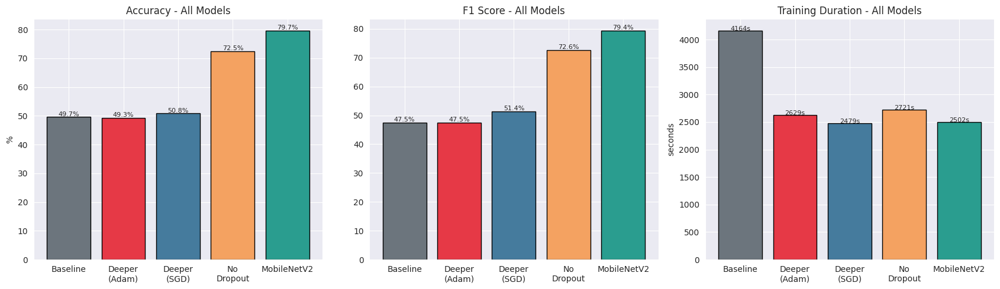

In [67]:
all_names = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No\nDropout', 'MobileNetV2']
all_acc = [baseline_metrics['accuracy'], deeper_metrics['accuracy'], acc_sgd, acc_abl, acc_tl]
all_f1 = [baseline_metrics['f1_score'], deeper_metrics['f1_score'], f1_sgd, f1_abl, f1_tl]
all_durs = [baseline_metrics['duration_sec'], deeper_metrics['duration_sec'], sgd_dur, ablation_dur, tl_total_dur]
final_colors = ['#6C757D', '#E63946', '#457B9D', '#F4A261', '#2A9D8F']

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

axes[0].bar(all_names, [a*100 for a in all_acc], color=final_colors, edgecolor='black')
axes[0].set_title('Accuracy - All Models')
axes[0].set_ylabel('%')
for i, v in enumerate(all_acc):
    axes[0].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=8)

axes[1].bar(all_names, [f*100 for f in all_f1], color=final_colors, edgecolor='black')
axes[1].set_title('F1 Score - All Models')
for i, v in enumerate(all_f1):
    axes[1].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=8)

axes[2].bar(all_names, all_durs, color=final_colors, edgecolor='black')
axes[2].set_title('Training Duration - All Models')
axes[2].set_ylabel('seconds')
for i, v in enumerate(all_durs):
    axes[2].text(i, v+2, f'{v:.0f}s', ha='center', fontsize=8)

plt.tight_layout()
plt.show()

## 8. Save Models to Drive

In [68]:
import pickle

DRIVE_DIR = '/content/drive/MyDrive/AI & Machine Learning/Assignment/Task1 (Image Classification)/food11_checkpoints'
os.makedirs(DRIVE_DIR, exist_ok=True)

net_baseline.save(f'{DRIVE_DIR}/net_baseline.keras')
net_deeper.save(f'{DRIVE_DIR}/net_deeper.keras')
net_deeper_sgd.save(f'{DRIVE_DIR}/net_deeper_sgd.keras')
net_ablation.save(f'{DRIVE_DIR}/net_ablation.keras')
net_tl.save(f'{DRIVE_DIR}/net_tl.keras')

checkpoint_data = {
    'baseline': baseline_metrics,
    'deeper': deeper_metrics,
    'sgd': {'accuracy': acc_sgd, 'precision': prec_sgd, 'recall': rec_sgd,
            'f1_score': f1_sgd, 'eval_loss': loss_sgd, 'duration_sec': sgd_dur,
            'history': hist_sgd.history},
    'ablation': {'accuracy': acc_abl, 'precision': prec_abl, 'recall': rec_abl,
                 'f1_score': f1_abl, 'eval_loss': loss_abl, 'duration_sec': ablation_dur,
                 'history': hist_ablation.history},
    'transfer': {'accuracy': acc_tl, 'precision': prec_tl, 'recall': rec_tl,
                 'f1_score': f1_tl, 'eval_loss': loss_tl, 'duration_sec': tl_total_dur,
                 'history': hist_tl.history}
}
with open(f'{DRIVE_DIR}/all_metrics.pkl', 'wb') as fh:
    pickle.dump(checkpoint_data, fh)

print(f"all artefacts saved to {DRIVE_DIR}")

all artefacts saved to /content/drive/MyDrive/AI & Machine Learning/Assignment/Task1 (Image Classification)/food11_checkpoints


In [69]:
import pickle
from tensorflow.keras.models import load_model

DRIVE_DIR = '/content/drive/MyDrive/AI & Machine Learning/Assignment/Task1 (Image Classification)/food11_checkpoints'

net_baseline = load_model(f'{DRIVE_DIR}/net_baseline.keras')
net_deeper = load_model(f'{DRIVE_DIR}/net_deeper.keras')
net_deeper_sgd = load_model(f'{DRIVE_DIR}/net_deeper_sgd.keras')
net_ablation = load_model(f'{DRIVE_DIR}/net_ablation.keras')
net_tl = load_model(f'{DRIVE_DIR}/net_tl.keras')

with open(f'{DRIVE_DIR}/all_metrics.pkl', 'rb') as fh:
    ckpt = pickle.load(fh)

baseline_metrics = ckpt['baseline']
deeper_metrics = ckpt['deeper']
acc_sgd, prec_sgd, rec_sgd, f1_sgd = ckpt['sgd']['accuracy'], ckpt['sgd']['precision'], ckpt['sgd']['recall'], ckpt['sgd']['f1_score']
loss_sgd, sgd_dur = ckpt['sgd']['eval_loss'], ckpt['sgd']['duration_sec']
acc_abl, prec_abl, rec_abl, f1_abl = ckpt['ablation']['accuracy'], ckpt['ablation']['precision'], ckpt['ablation']['recall'], ckpt['ablation']['f1_score']
loss_abl, ablation_dur = ckpt['ablation']['eval_loss'], ckpt['ablation']['duration_sec']
acc_tl, prec_tl, rec_tl, f1_tl = ckpt['transfer']['accuracy'], ckpt['transfer']['precision'], ckpt['transfer']['recall'], ckpt['transfer']['f1_score']
loss_tl, tl_total_dur = ckpt['transfer']['eval_loss'], ckpt['transfer']['duration_sec']

print("all models and metrics loaded successfully — no retraining needed")

all models and metrics loaded successfully — no retraining needed
